# Input-output properties cells

In [1]:
import numpy as np
import json
import os
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# CircuitPath = 'O1_data_physiology/' # edges files not inclued in https://github.com/FernandoSBorges/NetPyNE_SONATA/tree/main/SCx_model/O1_data_physiology

CircuitPath = '/home/fernando/Dropbox/SCx_model/O1_data_physiology/'
Atlas = CircuitPath + 'atlas/'
Atlas2 = 'O1_data_physiology/voxel_atlas_data/'
MorphologyPath = CircuitPath + 'morphologies/ascii/'
nrnPath = CircuitPath + 'S1nonbarrel_neurons__S1nonbarrel_neurons__chemical/edges.h5'
CellLibraryFile = CircuitPath + 'S1nonbarrel_neurons/nodes.h5'
METypePath = CircuitPath + 'emodels_hoc/'

lst_properties = [ 'etype', 'exc_mini_frequency', 'inh_mini_frequency', 'layer', 'me_combo', 'model_template', 'model_type', 'morph_class', 'morphology', 'mtype', 
                  'orientation_w', 'orientation_x', 'orientation_y', 'orientation_z', 'population', 'region', 'synapse_class', '@dynamics:holding_current', 
                  '@dynamics:input_resistance', '@dynamics:resting_potential', '@dynamics:threshold_current', 'x', 'y', 'z']

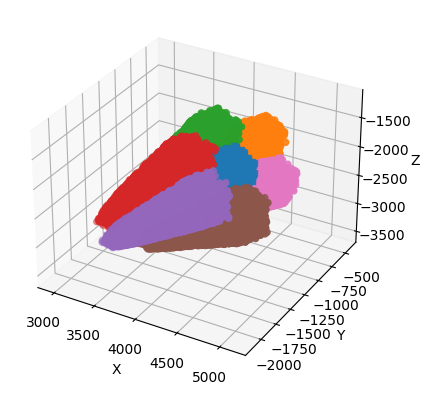

In [3]:
from bluepysnap import Circuit
from bluepysnap.bbp import Cell
circuit_path = CircuitPath + 'circuit_config.json'
circuit = Circuit(circuit_path)

cells = circuit.nodes["S1nonbarrel_neurons"]
proj_cells = circuit.nodes["external_S1nonbarrel_neurons__S1nonbarrel_neurons__chemical"]
cells_projections = proj_cells
nodesinfo = cells.get()
nodesinfo_projections = cells_projections.get()

In [4]:
nodesinfo[nodesinfo['mtype'] == 'L5_UPC'].head()

,etype,exc_mini_frequency,hexagon,inh_mini_frequency,layer,me_combo,model_template,model_type,morph_class,morphology,...,x,x_new,y,y_new,z,z_new,@dynamics:holding_current,@dynamics:input_resistance,@dynamics:resting_potential,@dynamics:threshold_current
node_ids,,,,,,,,,,,,,,,,,,,,,
175397,cADpyr,0.010108,4,0.233243,5,cADpyr_L5TPC_L5_UPC_5_dend-vd120112_idB_axon-v...,hoc:cADpyr_L5TPC,biophysical,PYR,dend-vd120112_idB_axon-vd130423_idB,...,3783.979592,1197.501656,-1726.950842,844.392074,-2621.002455,947.901133,-0.073128,96.699585,-78.179581,0.209156
175398,cADpyr,0.010108,1,0.233243,5,cADpyr_L5TPC_L5_UPC_5_dend-vd130423_idB_axon-F...,hoc:cADpyr_L5TPC,biophysical,PYR,dend-vd130423_idB_axon-Fluo15_right_-_Scale_x1...,...,3931.871542,37.637721,-568.664463,568.310246,-2346.674264,1079.239618,-0.056657,119.162033,-78.466377,0.171266
175399,cADpyr,0.010108,0,0.233243,5,cADpyr_L5TPC_L5_UPC_5_dend-rp110511_C1_idA_axo...,hoc:cADpyr_L5TPC,biophysical,PYR,dend-rp110511_C1_idA_axon-Fluo6_right_-_Scale_...,...,4000.858971,621.259451,-1187.016868,872.699325,-2564.674538,1042.144520,-0.047627,139.546387,-78.482635,0.137922
175400,cADpyr,0.010108,6,0.233243,5,cADpyr_L5TPC_L5_UPC_5_dend-rp101229_L5-1_idA_a...,hoc:cADpyr_L5TPC,biophysical,PYR,dend-rp101229_L5-1_idA_axon-rp110725_C2_idB_-_...,...,4051.578261,269.658907,-837.352989,908.497456,-2666.380189,940.769647,-0.051307,129.261276,-78.519058,0.154594
175401,cADpyr,0.010108,4,0.233243,5,cADpyr_L5TPC_L5_UPC_5_dend-rp110511_C1_idA_axo...,hoc:cADpyr_L5TPC,biophysical,PYR,dend-rp110511_C1_idA_axon-rp101213_L5-1_idC_-_...,...,4038.227764,931.110830,-1515.491111,981.329536,-2594.093027,1090.608972,-0.045801,141.744675,-78.627968,0.147016


In [5]:
# !nrnivmodl '/home/fernando/Dropbox/SCx_model/O1_data_physiology/mod/'

In [6]:
def distance3D(gidpre,gidpost):
    return np.sqrt(np.power(nodesinfo['x'][gidpre]-nodesinfo['x'][gidpost],2)+np.power(nodesinfo['y'][gidpre]-nodesinfo['y'][gidpost],2)+np.power(nodesinfo['z'][gidpre]-nodesinfo['z'][gidpost],2))

def distance2D(gidpre,gidpost):
    return np.sqrt(np.power(nodesinfo['x'][gidpre]-nodesinfo['x'][gidpost],2)+np.power(nodesinfo['y'][gidpre]-nodesinfo['y'][gidpost],2))

def distance2Dmean(gidpre, mean_x, mean_y):
    return np.sqrt(np.power(nodesinfo['x_new'][gidpre]-mean_x,2)+np.power(nodesinfo['y_new'][gidpre]-mean_y,2))

In [7]:
print(cells.property_values(Cell.REGION))

mtypes = sorted(cells.property_values(Cell.MTYPE))

i = 0
mntypes = {}
for mn in sorted(mtypes):
    mntypes[mn] = i
    i+=1

{'S1J', 'S1DZ', 'S1FL'}


## Select nodes to simulate

In [10]:
f = open('node_sets.json') 
node_sets = json.load(f) 

mean_x, mean_y = np.mean(nodesinfo['x_new']), np.mean(nodesinfo['y_new'])
node_gid = [] 
nodepremtype_new = []    
mtype_new = []     

hex = 'hex0'
for gid in node_sets['hex0']['node_id']: 
    if 'L1' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y)< 40.0:  
        node_gid.append(gid)
        nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
        if nodesinfo['mtype'][gid] not in mtype_new:
            mtype_new.append(nodesinfo['mtype'][gid])

        print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))
        
for gid in node_sets['hex0']['node_id']: 
    if 'L23' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y)< 25.0:  
        node_gid.append(gid)
        nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
        if nodesinfo['mtype'][gid] not in mtype_new:
            mtype_new.append(nodesinfo['mtype'][gid])

        print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))

for gid in node_sets['hex0']['node_id']: 
    if 'L2_' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y)< 25.0:  
        node_gid.append(gid)
        nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
        if nodesinfo['mtype'][gid] not in mtype_new:
            mtype_new.append(nodesinfo['mtype'][gid])

        print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))

for gid in node_sets['hex0']['node_id']: 
    if 'L3_' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y)< 25.0:  
        node_gid.append(gid)
        nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
        if nodesinfo['mtype'][gid] not in mtype_new:
            mtype_new.append(nodesinfo['mtype'][gid])

        print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))
        
for gid in node_sets['hex0']['node_id']: 
    if 'L4' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y)< 25.0:  
        node_gid.append(gid)
        nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
        if nodesinfo['mtype'][gid] not in mtype_new:
            mtype_new.append(nodesinfo['mtype'][gid])

        print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))
            
for gid in node_sets['hex0']['node_id']: 
    if 'L5' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y)< 25.0:  
        node_gid.append(gid)
        nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
        if nodesinfo['mtype'][gid] not in mtype_new:
            mtype_new.append(nodesinfo['mtype'][gid])

        print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))
        
for gid in node_sets['hex0']['node_id']: 
    if 'L6' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y)< 25.0:  
        node_gid.append(gid)
        nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
        if nodesinfo['mtype'][gid] not in mtype_new:
            mtype_new.append(nodesinfo['mtype'][gid])

        print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))

# non central col

# for hex in node_sets['hex_O1']:
#     for gid in node_sets[hex]['node_id']:     
#         if 'L1_' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y) > 703.0 and distance2Dmean(gid, mean_x, mean_y) < 704.0:  
#             node_gid.append(gid)
#             nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
#             if nodesinfo['mtype'][gid] not in mtype_new:
#                 mtype_new.append(nodesinfo['mtype'][gid])

#             print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))        
            
# for hex in node_sets['hex_O1']:
#     for gid in node_sets[hex]['node_id']:     
#         if 'L6_TPC' in nodesinfo['mtype'][gid] and distance2Dmean(gid, mean_x, mean_y) > 600.0 and distance2Dmean(gid, mean_x, mean_y) < 600.1:  
#             node_gid.append(gid)
#             nodepremtype_new.append(mntypes[nodesinfo['mtype'][gid]])
#             if nodesinfo['mtype'][gid] not in mtype_new:
#                 mtype_new.append(nodesinfo['mtype'][gid])

#             print(len(node_gid),gid,nodesinfo['mtype'][gid],hex,distance2Dmean(gid, mean_x, mean_y))        

# mtype_new, distance3D(90290,96883), distance3D(90290,102178)

1 7 L1_DAC hex0 26.990737576695835
2 33788 L1_NGC-DA hex0 38.63732975121551
3 34575 L1_HAC hex0 38.85416462870949
4 35137 L1_SAC hex0 38.683540484060075
5 35157 L1_SAC hex0 32.63913689668969
6 35206 L1_SAC hex0 39.62204687171059
7 26321 L23_MC hex0 22.096084070034653
8 147807 L23_NGC hex0 6.471895101606248
9 148107 L23_BTC hex0 17.91359872640971
10 148175 L23_BTC hex0 17.449080378355337
11 150634 L23_NBC hex0 16.330683341644516
12 151258 L23_NBC hex0 15.757094597291808
13 143026 L2_TPC:A hex0 19.075714695829436
14 143162 L2_TPC:A hex0 23.169094759918117
15 143288 L2_TPC:A hex0 21.871511005386537
16 144429 L2_TPC:A hex0 20.239879500541257
17 144555 L2_TPC:A hex0 22.288160693365704
18 145753 L2_TPC:A hex0 22.306682397157093
19 146854 L2_IPC hex0 7.792017276943925
20 147548 L2_IPC hex0 15.317250383105312
21 152318 L2_TPC:B hex0 20.99192853390441
22 152556 L2_TPC:B hex0 20.419154489940226
23 154199 L2_TPC:B hex0 8.11713170477625
24 155400 L2_TPC:B hex0 10.258436971417288
25 155672 L2_TPC:B

# Exploring the Lists

In [11]:
hoclist = sorted(cells.property_values(Cell.MODEL_TEMPLATE))
Morpholist = sorted(cells.property_values(Cell.MORPHOLOGY))
Mtypelist = sorted(cells.property_values(Cell.MTYPE))
Mtypelist[0:3], hoclist[0:3], Morpholist[0:3]

(['L1_DAC', 'L1_HAC', 'L1_LAC'],
 ['hoc:bAC_L23BTC', 'hoc:bAC_L6BTC', 'hoc:bIR_L23BP'],
 ['C010306C', 'C010306C_-_Clone_0', 'C010306C_-_Clone_1'])

# NetPyNE

In [12]:
from netpyne import specs, sim   

# Network parameters
netParams = specs.NetParams()  # object of class NetParams to store the network parameters

In [13]:
cellName_list = {}
cellName_list2 = []
gid_list = {}


for gid in node_gid:

    cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]

    if cellName not in cellName_list2:
        cellName_list2 = []
        
    cellName_list2.append(cellName)
    
    cellName_list[gid] = cellName + '_' + str(len(cellName_list2)-1)
    gid_list[cellName + '_' + str(len(cellName_list2)-1)] = gid
    
    print('%s \t %d' % (cellName + '_' + str(len(cellName_list2)-1),gid))

L1_DAC_cNAC_S1F_0 	 7
L1_NGC-DA_cNAC_S1F_0 	 33788
L1_HAC_cNAC_S1F_0 	 34575
L1_SAC_cACint_S1F_0 	 35137
L1_SAC_cNAC_S1F_0 	 35157
L1_SAC_cNAC_S1F_1 	 35206
L23_MC_cACint_S1F_0 	 26321
L23_NGC_cNAC_S1F_0 	 147807
L23_BTC_cACint_S1F_0 	 148107
L23_BTC_cACint_S1F_1 	 148175
L23_NBC_cACint_S1F_0 	 150634
L23_NBC_cNAC_S1F_0 	 151258
L2_TPC:A_cADpyr_S1F_0 	 143026
L2_TPC:A_cADpyr_S1F_1 	 143162
L2_TPC:A_cADpyr_S1F_2 	 143288
L2_TPC:A_cADpyr_S1F_3 	 144429
L2_TPC:A_cADpyr_S1F_4 	 144555
L2_TPC:A_cADpyr_S1F_5 	 145753
L2_IPC_cADpyr_S1F_0 	 146854
L2_IPC_cADpyr_S1F_1 	 147548
L2_TPC:B_cADpyr_S1F_0 	 152318
L2_TPC:B_cADpyr_S1F_1 	 152556
L2_TPC:B_cADpyr_S1F_2 	 154199
L2_TPC:B_cADpyr_S1F_3 	 155400
L2_TPC:B_cADpyr_S1F_4 	 155672
L2_TPC:B_cADpyr_S1F_5 	 155736
L2_TPC:B_cADpyr_S1F_6 	 155828
L2_TPC:B_cADpyr_S1F_7 	 156024
L2_TPC:B_cADpyr_S1F_8 	 157598
L2_TPC:B_cADpyr_S1F_9 	 159371
L2_TPC:B_cADpyr_S1F_10 	 159969
L2_TPC:B_cADpyr_S1F_11 	 160569
L2_TPC:B_cADpyr_S1F_12 	 161499
L2_TPC:B_cADpyr_S1F

In [15]:
cellsList = {}

for cellName in sorted(gid_list.keys()):
    try:
    
        gid = gid_list[cellName]

        # MorphoName = nodesinfo['morphology'][gid] + '.asc'

        hocName = nodesinfo['model_template'][gid][4:]  

        MorphologyPath = '/home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii/'
        
        MorphoName = nodesinfo['morphology'][gid]+"_gid"+str(gid)+".asc"

        print(cellName,hocName)
            
        cellRule = netParams.importCellParams(label=cellName, somaAtOrigin=True,
            conds={'cellType': cellName, 'cellModel': 'HH_full'},
            fileName='/home/fernando/Dropbox/SCx_model/O1_data_physiology/emodels_hoc2/' + hocName + '.hoc',
            cellName=hocName,
            cellInstance = False,
            cellArgs=[gid, MorphologyPath, MorphoName])
        
        # netParams.cellParams[cellName]['secs']['axon_0']['geom']['Ra'] = 2.0*netParams.cellParams[cellName]['secs']['axon_0']['geom']['Ra']

        cellsList[cellName] = [{'x': nodesinfo['x'][gid], 'y': nodesinfo['y'][gid], 'z': nodesinfo['z'][gid]}]
        # cellsList[cellName] = [{'x': nodesinfo['x'][gid] - 3000.0, 'y': nodesinfo['y'][gid] + 2000.0, 'z': nodesinfo['z'][gid] + 3500.0}]
    except:
        pass        
# cellsList


L1_DAC_cNAC_S1F_0 cNAC_L4CHC
L1_HAC_cNAC_S1F_0 cNAC_L6BTC
L1_NGC-DA_cNAC_S1F_0 cNAC_L6BTC
L1_SAC_cACint_S1F_0 cACint_L4CHC
L1_SAC_cNAC_S1F_0 cNAC_L23BTC
L1_SAC_cNAC_S1F_1 cNAC_L6NGC
L23_BTC_cACint_S1F_0 cACint_L23MC
L23_BTC_cACint_S1F_1 cACint_L23MC


NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//C060400C1_-_Scale_x1.000_y1.050_z1.000_-_Clone_0_gid26321.asc :file is not open
 near line 0
 {cACint_L23MC[4].soma[0] gIhbar_Ih(0.500000) = (-0.8696 + 2.087*exp((0)*0.0031))*2.5561473245947519e-06}
                                                                                                         ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  cACint_L23MC[5].load_morphology("/home/fern...", "C060400C1_...")
and others


L23_MC_cACint_S1F_0 cACint_L23MC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//C060400C1_-_Scale_x1.000_y1.050_z1.000_-_Clone_0_gid26321.asc
L23_NBC_cACint_S1F_0 cACint_L4CHC
L23_NBC_cNAC_S1F_0 cNAC_L23NGC
L23_NGC_cNAC_S1F_0 cNAC_L6NGC
L2_IPC_cADpyr_S1F_0 cADpyr_L2TPC
L2_IPC_cADpyr_S1F_1 cADpyr_L2IPC
L2_TPC:A_cADpyr_S1F_0 cADpyr_L2IPC
L2_TPC:A_cADpyr_S1F_1 cADpyr_L2IPC
L2_TPC:A_cADpyr_S1F_2 cADpyr_L2IPC
L2_TPC:A_cADpyr_S1F_3 cADpyr_L2IPC
L2_TPC:A_cADpyr_S1F_4 cADpyr_L2TPC
L2_TPC:A_cADpyr_S1F_5 cADpyr_L2IPC
L2_TPC:B_cADpyr_S1F_0 cADpyr_L2IPC
L2_TPC:B_cADpyr_S1F_1 cADpyr_L2IPC
L2_TPC:B_cADpyr_S1F_10 cADpyr_L2TPC
L2_TPC:B_cADpyr_S1F_11 cADpyr_L2TPC
L2_TPC:B_cADpyr_S1F_12 cADpyr_L2IPC
L2_TPC:B_cADpyr_S1F_13 cADpyr_L2IPC
L2_TPC:B_cADpyr_S1F_14 cADpyr_L2TPC
L2_TPC:B_cADpyr_S1F_15 cADpyr_L2IPC
L2_TPC:B_cADpyr_S1F_16 cADpyr_L2IPC
L2_TPC:B_cADpyr_S1F_17 cADpyr_L2IPC
L2_TPC:B_cADpyr_S1F_18 cADpyr_L2TPC
L2_TPC:B_cADpyr_S1F_19 cADpyr_L2IPC
L2_TPC:B_cADpyr_

NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp120914_P_1_idA_-_Scale_x1.000_y0.975_z1.000_-_Clone_1_gid142352.asc :file is not open
 near line 0
 {cADpyr_L2TPC[44].soma[0] gIhbar_Ih(0.500000) = (-0.8696 + 2.087*exp((0)*0.0031))*2.7754142473166435e-08}
                                                                                                          ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  cACint_L23MC[6].load_morphology("/home/fern...", "rp120914_P...")
and others
NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//C240298B-I4_gid142804.asc :file is not open
 near line 0
 ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  dSTUT_L2SBC[0].load_morphology("/home/fern...", "C240298B-I...")
and others


L4_LBC_cACint_S1F_0 cACint_L23MC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp120914_P_1_idA_-_Scale_x1.000_y0.975_z1.000_-_Clone_1_gid142352.asc
L4_LBC_dSTUT_S1F_0 dSTUT_L2SBC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//C240298B-I4_gid142804.asc
L4_MC_cACint_S1F_0 cACint_L4CHC
L4_NBC_cNAC_S1F_0 cNAC_L4CHC
L4_SSC_cADpyr_S1F_0 cADpyr_L4UPC
L4_SSC_cADpyr_S1F_1 cADpyr_L4TPC
L4_SSC_cADpyr_S1F_2 cADpyr_L4UPC
L4_SSC_cADpyr_S1F_3 cADpyr_L4UPC
L4_SSC_cADpyr_S1F_4 cADpyr_L4TPC
L4_SSC_cADpyr_S1F_5 cADpyr_L4TPC
L4_SSC_cADpyr_S1F_6 cADpyr_L4TPC
L4_TPC_cADpyr_S1F_0 cADpyr_L4TPC
L4_TPC_cADpyr_S1F_1 cADpyr_L4TPC
L4_TPC_cADpyr_S1F_10 cADpyr_L4TPC
L4_TPC_cADpyr_S1F_11 cADpyr_L4UPC
L4_TPC_cADpyr_S1F_12 cADpyr_L4TPC
L4_TPC_cADpyr_S1F_13 cADpyr_L4UPC
L4_TPC_cADpyr_S1F_14 cADpyr_L4TPC
L4_TPC_cADpyr_S1F_15 cADpyr_L4TPC
L4_TPC_cADpyr_S1F_16 cADpyr_L4TPC
L4_TPC_cADpyr_S1F_17 cADpyr_L4UPC
L4_TPC_cADpyr_S1F_18 cADpyr_L4UPC


NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110427_C1_idB_-_Clone_1_gid179487.asc :file is not open
 near line 0
 {cADpyr_L4UPC[25].soma[0] gIhbar_Ih(0.500000) = (-0.8696 + 2.087*exp((0)*0.0031))*0.00016020154747782431}
                                                                                                          ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  cNAC_L4CHC[3].load_morphology("/home/fern...", "rp110427_C...")
and others
NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110203_L5-2_idA_-_Scale_x1.000_y0.950_z1.000_-_Clone_3_gid173897.asc :file is not open
 near line 0
 ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  cACint_L4CHC[4].load_morphology("/home/fern...", "rp110203_L...")
and others
NEURON: /home/fernando/Dropbox/SC

L5_BTC_cNAC_S1F_0 cNAC_L4CHC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110427_C1_idB_-_Clone_1_gid179487.asc
L5_LBC_cACint_S1F_0 cACint_L4CHC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110203_L5-2_idA_-_Scale_x1.000_y0.950_z1.000_-_Clone_3_gid173897.asc
L5_LBC_cSTUT_S1F_0 cSTUT_L23NGC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110419_C1_idA_-_Scale_x1.000_y1.025_z1.000_-_Clone_2_gid173251.asc
L5_LBC_cSTUT_S1F_1 cSTUT_L6NGC


NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//mtC050301A_idC_-_Scale_x1.000_y0.950_z1.000_gid174422.asc :file is not open
 near line 0
 ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  dNAC_L23SBC[0].load_morphology("/home/fern...", "mtC050301A...")
and others
NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110120_L5-2_idH_-_Clone_3_gid174741.asc :file is not open
 near line 0
 ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  dSTUT_L23BP[0].load_morphology("/home/fern...", "rp110120_L...")
and others
NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp101020_2_INT_idA_-_Scale_x1.000_y1.025_z1.000_gid211050.asc :file is not open
 near line 0
 ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
  

L5_LBC_dNAC_S1F_0 dNAC_L23SBC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//mtC050301A_idC_-_Scale_x1.000_y0.950_z1.000_gid174422.asc
L5_LBC_dSTUT_S1F_0 dSTUT_L23BP
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110120_L5-2_idH_-_Clone_3_gid174741.asc
L5_MC_cACint_S1F_0 cACint_L4CHC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp101020_2_INT_idA_-_Scale_x1.000_y1.025_z1.000_gid211050.asc
L5_MC_cACint_S1F_1 cACint_L23MC


NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//mtC110301B_idA_-_Scale_x1.000_y1.050_z1.000_-_Clone_0_gid178413.asc :file is not open
 near line 0
 {cACint_L23MC[7].soma[0] gIhbar_Ih(0.500000) = (-0.8696 + 2.087*exp((0)*0.0031))*2.5561473245947519e-06}
                                                                                                         ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  cACint_L4CHC[6].load_morphology("/home/fern...", "mtC110301B...")
and others
NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//mtC050600A_idA_-_Scale_x1.000_y0.950_z1.000_-_Clone_3_gid178443.asc :file is not open
 near line 0
 ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  cNAC_L4CHC[4].load_morphology("/home/fern...", "mtC050600A...")
and others


L5_NBC_cACint_S1F_0 cACint_L4CHC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//mtC110301B_idA_-_Scale_x1.000_y1.050_z1.000_-_Clone_0_gid178413.asc
L5_NBC_cNAC_S1F_0 cNAC_L4CHC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//mtC050600A_idA_-_Scale_x1.000_y0.950_z1.000_-_Clone_3_gid178443.asc
L5_NBC_cNAC_S1F_1 cNAC_L23NGC


NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//mtC010301B_idE_-_Scale_x1.000_y1.050_z1.000_-_Clone_2_gid178754.asc :file is not open
 near line 0
 {cNAC_L23NGC[1].soma[0] gIhbar_Ih(0.500000) = (-0.8696 + 2.087*exp((0)*0.0031))*4.3297432871800955e-06}
                                                                                                        ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  cSTUT_L6NGC[1].load_morphology("/home/fern...", "mtC010301B...")
and others


L5_NBC_cSTUT_S1F_0 cSTUT_L6NGC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//mtC010301B_idE_-_Scale_x1.000_y1.050_z1.000_-_Clone_2_gid178754.asc
L5_TPC:A_cADpyr_S1F_0 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_1 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_10 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_11 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_12 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_13 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_14 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_15 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_16 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_17 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_18 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_19 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_2 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_20 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_21 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_22 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_23 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_24 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_25 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_26 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_27 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_28 cADpyr_L5TPC
L5_TPC:A_cADpyr_S1F_29 c

NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//tkb070808_b1-b2_idC_-_Scale_x1.000_y1.050_z1.000_-_Clone_3_gid69211.asc :file is not open
 near line 0
 ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  bAC_L23BTC[0].load_morphology("/home/fern...", "tkb070808_...")
and others


L6_LBC_bAC_S1F_0 bAC_L23BTC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//tkb070808_b1-b2_idC_-_Scale_x1.000_y1.050_z1.000_-_Clone_3_gid69211.asc
L6_LBC_bIR_S1F_0 bIR_L5BP
L6_LBC_bSTUT_S1F_0 bSTUT_L5NBC
L6_MC_cACint_S1F_0 cACint_L4CHC
L6_NBC_cNAC_S1F_0 cNAC_L4CHC
L6_NBC_cSTUT_S1F_0 cSTUT_L23NGC


NEURON: /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110125_L5-2_idA_-_Scale_x1.000_y1.050_z1.000_-_Clone_8_gid48754.asc :file is not open
 near line 0
 {cSTUT_L23NGC[1].soma[0] gIhbar_Ih(0.500000) = (-0.8696 + 2.087*exp((0)*0.0031))*4.0057879558855978e-06}
                                                                                                         ^
        File[0].eof()
      Import3d_Neurolucida3[0].rdfile("/home/fern...")
    Import3d_Neurolucida3[0].input("/home/fern...")
  cNAC_L23NGC[2].load_morphology("/home/fern...", "rp110125_L...")
and others


L6_NGC_cNAC_S1F_0 cNAC_L23NGC
could not open /home/fernando/Dropbox/SCx_model/O1_data_physiology/morphologies2/ascii//rp110125_L5-2_idA_-_Scale_x1.000_y1.050_z1.000_-_Clone_8_gid48754.asc
L6_TPC:A_cADpyr_S1F_0 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_1 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_10 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_11 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_12 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_13 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_14 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_15 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_16 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_17 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_18 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_19 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_2 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_20 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_21 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_22 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_23 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_24 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_25 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_3 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_4 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_5 cADpyr_L6BPC
L6_TPC:A_cADpyr_S1F_6 cADp

In [16]:
# netParams.cellParams[cellName]
for cellName in netParams.cellParams.keys():    
    netParams.popParams[cellName] = {'cellType': cellName, 'cellsList': cellsList[cellName], 'cellModel': 'HH_full'}

In [19]:
netParams.popParams.keys()

odict_keys(['L1_DAC_cNAC_S1F_0', 'L1_HAC_cNAC_S1F_0', 'L1_NGC-DA_cNAC_S1F_0', 'L1_SAC_cACint_S1F_0', 'L1_SAC_cNAC_S1F_0', 'L1_SAC_cNAC_S1F_1', 'L23_BTC_cACint_S1F_0', 'L23_BTC_cACint_S1F_1', 'L23_NBC_cACint_S1F_0', 'L23_NBC_cNAC_S1F_0', 'L23_NGC_cNAC_S1F_0', 'L2_IPC_cADpyr_S1F_0', 'L2_IPC_cADpyr_S1F_1', 'L2_TPC:A_cADpyr_S1F_0', 'L2_TPC:A_cADpyr_S1F_1', 'L2_TPC:A_cADpyr_S1F_2', 'L2_TPC:A_cADpyr_S1F_3', 'L2_TPC:A_cADpyr_S1F_4', 'L2_TPC:A_cADpyr_S1F_5', 'L2_TPC:B_cADpyr_S1F_0', 'L2_TPC:B_cADpyr_S1F_1', 'L2_TPC:B_cADpyr_S1F_10', 'L2_TPC:B_cADpyr_S1F_11', 'L2_TPC:B_cADpyr_S1F_12', 'L2_TPC:B_cADpyr_S1F_13', 'L2_TPC:B_cADpyr_S1F_14', 'L2_TPC:B_cADpyr_S1F_15', 'L2_TPC:B_cADpyr_S1F_16', 'L2_TPC:B_cADpyr_S1F_17', 'L2_TPC:B_cADpyr_S1F_18', 'L2_TPC:B_cADpyr_S1F_19', 'L2_TPC:B_cADpyr_S1F_2', 'L2_TPC:B_cADpyr_S1F_20', 'L2_TPC:B_cADpyr_S1F_21', 'L2_TPC:B_cADpyr_S1F_22', 'L2_TPC:B_cADpyr_S1F_23', 'L2_TPC:B_cADpyr_S1F_24', 'L2_TPC:B_cADpyr_S1F_3', 'L2_TPC:B_cADpyr_S1F_4', 'L2_TPC:B_cADpyr_S1F_5', 'L2_T

## Net info

In [20]:
print(list(circuit.nodes))
print(list(circuit.edges))

['POm', 'S1nonbarrel_neurons', 'VPM', 'external_S1nonbarrel_neurons__S1nonbarrel_neurons__chemical']
['POm__S1nonbarrel_neurons__chemical', 'S1nonbarrel_neurons__S1nonbarrel_neurons__chemical', 'VPM__S1nonbarrel_neurons__chemical', 'external_S1nonbarrel_neurons__S1nonbarrel_neurons__chemical']


In [21]:
cells = circuit.nodes["S1nonbarrel_neurons"]
conn = circuit.edges["S1nonbarrel_neurons__S1nonbarrel_neurons__chemical"]

proj_cells = circuit.nodes["external_S1nonbarrel_neurons__S1nonbarrel_neurons__chemical"]
proj_conn = circuit.edges["external_S1nonbarrel_neurons__S1nonbarrel_neurons__chemical"]
print(cells.size)
print(conn.size)
print(proj_cells.size)
print(proj_conn.size)

211712
406836913
549126
104319446


### Synaptic connectivity

The synaptic connectivity of the model is accessed using circ_extr.edges.
As an example, let's find out which neurons innervate an exemplary neuron

In [22]:
var_list_a = ['@source_node','@target_node','conductance','conductance_scale_factor','decay_time','delay','depression_time',
                'facilitation_time','n_rrp_vesicles','spine_length','syn_type_id','u_hill_coefficient','u_syn', 
                'afferent_section_id', 'afferent_section_type', 'afferent_segment_id','efferent_section_id', 'efferent_section_type', 'efferent_segment_id']
list_pre = []

for gid2 in node_gid:
# afferent edges of node_ids[gid2]
    sampled_edge_ids = conn.afferent_edges(gid2)
    
    var_list_a = sorted(conn.property_names)
    
    connsinfo = conn.get(sampled_edge_ids,var_list_a)
    
    unique, counts = np.unique(list(connsinfo['@source_node'].values), return_counts=True)
    # unique, counts 
    synNumber = dict(zip(unique, counts))
    # synNumber
    
    for gid in node_gid:
        try:
            print("gid =",gid, cellName_list[gid], "\t coonected with \t gid =",gid2,cellName_list[gid2],'\t with',synNumber[gid], 'connections',
                  list([netParams.cellParams[cellName_list[gid]]['secLists']['all'][isecN] for isecN in connsinfo.get(connsinfo['@source_node']==gid)['efferent_section_id'].values]),
                  list([netParams.cellParams[cellName_list[gid2]]['secLists']['all'][isecN] for isecN in connsinfo.get(connsinfo['@source_node']==gid)['afferent_section_id'].values]))


            synType = connsinfo.get(connsinfo['@source_node']==gid)['syn_type_id'].values[0]

            if synType > 99:

                print("EXC -> gid =",gid, cellName_list[gid],"synType =",synType)

                netParams.synMechParams[cellName_list[gid]+'->'+cellName_list[gid2]] = {'mod': 'ProbAMPANMDA_EMS',
                                            'Dep': connsinfo.get(connsinfo['@source_node']==gid)['depression_time'].values[0],
                                            'Fac': connsinfo.get(connsinfo['@source_node']==gid)['facilitation_time'].values[0],
                                            'Use': connsinfo.get(connsinfo['@source_node']==gid)['u_syn'].values[0]/connsinfo.get(connsinfo['@source_node']==gid)['u_hill_coefficient'].values[0],
                                            'tau_d_AMPA': connsinfo.get(connsinfo['@source_node']==gid)['decay_time'].values[0],
                                            'NMDA_ratio':0.8,
                                            # 'Nrrp':connsinfo.get(connsinfo['@source_node']==gid)['n_rrp_vesicles'].values[0],
                                            }            
            else:

                print("INH -> gid =",gid, cellName_list[gid],"synType =",synType)                

                netParams.synMechParams[cellName_list[gid]+'->'+cellName_list[gid2]] = {'mod': 'ProbGABAAB_EMS',
                                            'Dep': connsinfo.get(connsinfo['@source_node']==gid)['depression_time'].values[0],
                                            'Fac': connsinfo.get(connsinfo['@source_node']==gid)['facilitation_time'].values[0],
                                            'Use': connsinfo.get(connsinfo['@source_node']==gid)['u_syn'].values[0]/connsinfo.get(connsinfo['@source_node']==gid)['u_hill_coefficient'].values[0],
                                            'tau_d_GABAA': connsinfo.get(connsinfo['@source_node']==gid)['decay_time'].values[0],
                                            'GABAB_ratio':0.0,
                                            # 'Nrrp':connsinfo.get(connsinfo['@source_node']==gid)['n_rrp_vesicles'].values[0], # new ProbGABAAB_EMS.mod not working, using 2015 version without 'Nrrp'
                                            }
                
            print(netParams.synMechParams[cellName_list[gid]+'->'+cellName_list[gid2]])


            netParams.connParams[cellName_list[gid]+'->'+cellName_list[gid2]] = { 
                        'preConds': {'pop': cellName_list[gid]},
                        'postConds': {'pop': cellName_list[gid2]},
                        'connList': [[0,0] for ii in range(len(connsinfo.get(connsinfo['@source_node']==gid)))],
                        'sec': list([netParams.cellParams[cellName_list[gid2]]['secLists']['all'][isecN] for isecN in connsinfo.get(connsinfo['@source_node']==gid)['afferent_section_id'].values]),                  # target postsyn section
                        'synMech': cellName_list[gid]+'->'+cellName_list[gid2],              # target synaptic mechanism
                        'weight': list(1.0*connsinfo.get(connsinfo['@source_node']==gid)['conductance'].values*connsinfo.get(connsinfo['@source_node']==gid)['conductance_scale_factor'].values[0]),                 # synaptic weight 
                        'delay':list(connsinfo.get(connsinfo['@source_node']==gid)['delay'].values),                 # synaptic delay 
                        # 'loc':list(connsinfo.get(connsinfo['@source_node']==gid)['afferent_section_pos'].values), # error only to plotShape syn positions
                        }    
                
            print(netParams.connParams[cellName_list[gid]+'->'+cellName_list[gid2]]) 
            
            if gid not in list_pre:
                list_pre.append(gid)
                
            print(connsinfo.get(connsinfo['@source_node']==gid)['conductance'].values[0],connsinfo.get(connsinfo['@source_node']==gid)['conductance_scale_factor'].values[0],
                  connsinfo.get(connsinfo['@source_node']==gid)['u_syn'].values[0],connsinfo.get(connsinfo['@source_node']==gid)['u_hill_coefficient'].values[0],
                  connsinfo.get(connsinfo['@source_node']==gid)['depression_time'].values[0],connsinfo.get(connsinfo['@source_node']==gid)['facilitation_time'].values[0],
                  connsinfo.get(connsinfo['@source_node']==gid)['decay_time'].values[0],connsinfo.get(connsinfo['@source_node']==gid)['n_rrp_vesicles'].values[0],
                  )
            print()
        except:
            pass #print(gid,cellName_list[gid], "\tnot coonected with \t gid =",gid2,cellName_list[gid2])

gid = 33788 L1_NGC-DA_cNAC_S1F_0 	 coonected with 	 gid = 7 L1_DAC_cNAC_S1F_0 	 with 5 connections ['soma_0', 'soma_0', 'soma_0', 'soma_0', 'soma_0'] ['dend_27', 'dend_51', 'soma_0', 'dend_67', 'dend_35']
INH -> gid = 33788 L1_NGC-DA_cNAC_S1F_0 synType = 0
{'mod': 'ProbGABAAB_EMS', 'Dep': 437.3415832519531, 'Fac': 19.2307186126709, 'Use': 0.17882130809665955, 'tau_d_GABAA': 6.604036808013916, 'GABAB_ratio': 0.0}
{'preConds': {'pop': 'L1_NGC-DA_cNAC_S1F_0'}, 'postConds': {'pop': 'L1_DAC_cNAC_S1F_0'}, 'connList': [[0, 0], [0, 0], [0, 0], [0, 0], [0, 0]], 'sec': ['dend_27', 'dend_51', 'soma_0', 'dend_67', 'dend_35'], 'synMech': 'L1_NGC-DA_cNAC_S1F_0->L1_DAC_cNAC_S1F_0', 'weight': [0.0, 0.0, 0.0, 0.0, 0.0], 'delay': [0.66909724, 0.94738, 0.56782764, 0.96949285, 1.05933]}
2.092395067214966 0.0 0.34691333770751953 1.94 437.3415832519531 19.2307186126709 6.604036808013916 1

gid = 34575 L1_HAC_cNAC_S1F_0 	 coonected with 	 gid = 7 L1_DAC_cNAC_S1F_0 	 with 1 connections ['soma_0'] ['dend_70']


In [23]:
var_list_a = ['@source_node','@target_node',
            #   'conductance','conductance_scale_factor','decay_time','delay','depression_time',
                # 'facilitation_time','n_rrp_vesicles','spine_length','syn_type_id','u_hill_coefficient','u_syn', 
                'afferent_section_id', 'afferent_section_type', 'afferent_segment_id','efferent_section_id', 'efferent_section_type', 'efferent_segment_id']

gid = 169225
gid2 = 205580
# afferent edges of node_ids[gid2]
sampled_edge_ids = conn.afferent_edges(gid2)    
# var_list_a = sorted(conn.property_names)[0:12]    
connsinfo = conn.get(sampled_edge_ids,var_list_a)
connsinfo.get(connsinfo['@source_node']==gid)

,@source_node,@target_node,afferent_section_id,afferent_section_type,afferent_segment_id,efferent_section_id,efferent_section_type,efferent_segment_id
384503103,169225,205580,289,4,15,33,2,37
384503104,169225,205580,306,4,70,68,2,44
384503105,169225,205580,289,4,1,73,2,13
384503106,169225,205580,328,4,26,77,2,0
384503107,169225,205580,328,4,25,80,2,0


In [24]:
list_pre

[33788,
 34575,
 35137,
 148175,
 150634,
 147548,
 152556,
 160569,
 5931,
 120403,
 7,
 35157,
 151258,
 56879,
 159969,
 167103,
 167430,
 30742,
 143288,
 152318,
 14009,
 121387,
 35206,
 147807,
 145753,
 162488,
 131332,
 143162,
 159371,
 9125,
 139754,
 141017,
 148107,
 146854,
 154199,
 161499,
 16452,
 170233,
 144555,
 203645,
 169225,
 26902,
 183148,
 22787,
 189082,
 166556,
 155400,
 155828,
 27667,
 116420,
 163692,
 16981,
 113019,
 157598,
 130094,
 161842,
 211433,
 17643,
 130055,
 165370,
 14021,
 143026,
 112531,
 155736,
 4737,
 144429,
 9056,
 15868,
 17278,
 19808,
 22311,
 22788,
 171522,
 7366,
 140931,
 4422,
 12083,
 16860,
 18757,
 22108,
 114264,
 122954,
 132706,
 182135,
 94024,
 33232,
 138402,
 13381,
 22601,
 155672,
 165164,
 156024,
 17117,
 17746,
 20842,
 123553,
 127289,
 130190,
 131667,
 173539,
 1566,
 27480,
 163514,
 17859,
 117199,
 13798,
 23537,
 130206,
 133289,
 133580,
 125547,
 137561,
 131862,
 135956,
 182093,
 12046,
 114599,
 1

In [25]:
for gid in list_pre:

    popName1 = cellName_list[gid]
    current1 = 1.5*cells.get(gid,['@dynamics:threshold_current']).values[0]
    holding_current1 = cells.get(gid,['@dynamics:holding_current']).values[0]

    netParams.stimSourceParams['Input_'+str(gid)] = {'type': 'IClamp', 'del': 0.0, 'dur': 1500.0, 'amp': holding_current1}
    netParams.stimSourceParams['Inputb_'+str(gid)] = {'type': 'IClamp', 'del': 300.0, 'dur': 1000.0, 'amp':current1}

    netParams.stimTargetParams['Input->'+str(gid)] = {'source': 'Input_'+str(gid), 'sec':'soma_0', 'loc': 0.5, 'conds': {'pop':popName1}}
    netParams.stimTargetParams['Inputb->'+str(gid)] = {'source': 'Inputb_'+str(gid), 'sec':'soma_0', 'loc': 0.5, 'conds': {'pop':popName1}}

In [26]:
#------------------------------------------------------------------------------
# General network parameters
#------------------------------------------------------------------------------
netParams.scale = 1.0 # Scale factor for number of cells
netParams.sizeX = 420.0 # x-dimension (horizontal length) size in um
netParams.sizeY = 500.0 # y-dimension (vertical height or cortical depth) size in um
netParams.sizeZ = 420.0 # z-dimension (horizontal depth) size in um
netParams.shape = 'cylinder' # cylindrical (column-like) volume
   

In [27]:
#------------------------------------------------------------------------------
#
# SIMULATION CONFIGURATION
#
#------------------------------------------------------------------------------

cfg = specs.SimConfig()					            # object of class SimConfig to store simulation configuration

cfg.coreneuron = False

#------------------------------------------------------------------------------
# Run parameters
#------------------------------------------------------------------------------
cfg.duration = 0.5*1e3 ## Duration of the sim, in ms  
cfg.dt = 0.05
cfg.seeds = {'conn': 4321, 'stim': 1000, 'loc': 4321} 
cfg.hParams = {'celsius': 34, 'v_init': -84.0}  
cfg.verbose = False
cfg.createNEURONObj = True
cfg.createPyStruct = True  
cfg.cvode_active = False
cfg.cvode_atol = 1e-6
cfg.cache_efficient = True
cfg.printRunTime = 0.1

cfg.includeParamsLabel = False
cfg.printPopAvgRates = True
cfg.checkErrors = False

#--------------------------------------------------------------------------
# Recording 
#--------------------------------------------------------------------------
# cfg.recordTraces = {'V_soma': {'sec':'soma_0', 'loc':0.5, 'var':'v'}}  ## Dict with traces to record  
cfg.recordTraces = {'V_soma': {'sec':'soma_0', 'loc':0.5, 'var':'v'},
                    # 'V_axon_0': {'sec':'axon_0', 'loc':0.5, 'var':'v'},
                    # 'V_axon_1': {'sec':'axon_1', 'loc':0.5, 'var':'v'},
                    # 'V_axon_2': {'sec':'axon_2', 'loc':0.5, 'var':'v'},
                    # 'V_axon_15': {'sec':'axon_15', 'loc':0.5, 'var':'v'},
                    # 'V_apic_0': {'sec':'apic_0', 'loc':0.5, 'var':'v'},
                    # 'V_apic_47': {'sec':'apic_47', 'loc':0.5, 'var':'v'},       
                    # 'V_apic_64': {'sec':'apic_64', 'loc':0.5, 'var':'v'},
                    # 'V_apic_86': {'sec':'apic_86', 'loc':0.5, 'var':'v'},           
                    # 'V_dend_0': {'sec':'dend_0', 'loc':0.5, 'var':'v'},       
                    # 'V_dend_15': {'sec':'dend_15', 'loc':0.5, 'var':'v'},
                    }
cfg.recordStim = False			
cfg.recordTime = False  		
cfg.recordStep = 0.05       

#------------------------------------------------------------------------------
# Saving
#------------------------------------------------------------------------------
cfg.simLabel = 'v0_batch0'       #   + str(cfg.cynradNumber)
cfg.saveFolder = 'exploration/data/'+cfg.simLabel
# cfg.filename =                	## Set file output name
cfg.savePickle = False	        	## Save pkl file
cfg.saveJson = False           	## Save json file
cfg.saveDataInclude = ['simData', 'simConfig', 'net', 'netParams'] ## ['simData'] ##  ['simData'] ##, , 'simConfig', 'netParams'
cfg.backupCfgFile = None 		##  
cfg.gatherOnlySimData = False	##  
cfg.saveCellSecs = True			
cfg.saveCellConns = True	

#------------------------------------------------------------------------------
# Analysis and plotting 
# ------------------------------------------------------------------------------
# cfg.analysis['plotRaster'] = {'include': cfg.S1cells, 'saveFig': True, 'showFig': False,'orderInverse': True, 'timeRange': [0,cfg.duration], 'figSize': (24,8), 'fontSize':4, 'markerSize':4, 'marker': 'o', 'dpi': 300} 
# cfg.analysis['plot2Dnet']   = {'include': ['presyn_L23_PC_cAD','presyn_L5_TTPC2_cAD', 'presyn_VPM_sTC','L23_PC_cAD','L5_TTPC2_cAD'],'saveFig': True, 'showConns': False, 'figSize': (24,24), 'view': 'xz', 'fontSize':16}   # Plot 2D cells xy
# cfg.analysis['plotTraces'] = {'include': cfg.recordCells, 'oneFigPer': 'trace', 'overlay': True, 'timeRange': [0,cfg.duration], 'ylim': [-100,50], 'saveFig': True, 'showFig': False, 'figSize':(24,24)}

cfg.analysis['plotTraces'] = {'include': [ii for ii in range(len(node_gid))], 'oneFigPer': 'trace', 'overlay': True, 'timeRange': [0,cfg.duration], 'saveFig': False, 'showFig': True, 'figSize':(24,4)} # , 'ylim': [-90,30] Plot recorded traces for this list of cells
# cfg.analysis['plotShape'] = {'includePre':  [ii for ii in range(10)],'includePre':  [ii for ii in range(10)], 'saveFig': True, 'showFig': True, 'figSize':(12,12)}

In [28]:
cfg.invertedYCoord = False

In [29]:
sim.initialize(
    simConfig = cfg, 	
    netParams = netParams)  				# create network object and set cfg and net params
sim.net.createPops()               			# instantiate network populations


Start time:  2024-10-23 20:11:46.555103


{L1_DAC_cNAC_S1F_0: <netpyne.network.pop.Pop object at 0x7bd6c7f4ba60>, L1_HAC_cNAC_S1F_0: <netpyne.network.pop.Pop object at 0x7bd66aa76640>, L1_NGC-DA_cNAC_S1F_0: <netpyne.network.pop.Pop object at 0x7bd6c73cec10>, L1_SAC_cACint_S1F_0: <netpyne.network.pop.Pop object at 0x7bd6c73cec40>, L1_SAC_cNAC_S1F_0: <netpyne.network.pop.Pop object at 0x7bd66abfe490>, L1_SAC_cNAC_S1F_1: <netpyne.network.pop.Pop object at 0x7bd6d3328d60>, L23_BTC_cACint_S1F_0: <netpyne.network.pop.Pop object at 0x7bd6cb4be6a0>, L23_BTC_cACint_S1F_1: <netpyne.network.pop.Pop object at 0x7bd6cb4be430>, L23_NBC_cACint_S1F_0: <netpyne.network.pop.Pop object at 0x7bd6cb4bea00>, L23_NBC_cNAC_S1F_0: <netpyne.network.pop.Pop object at 0x7bd6cb4bee20>, L23_NGC_cNAC_S1F_0: <netpyne.network.pop.Pop object at 0x7bd6cb4be670>, L2_IPC_cADpyr_S1F_0: <netpyne.network.pop.Pop object at 0x7bd6cb4beca0>, L2_IPC_cADpyr_S1F_1: <netpyne.network.pop.Pop object at 0x7bd6cb4be160>, L2_TPC:A_cADpyr_S1F_0: <netpyne.network.pop.Pop object a

In [30]:
sim.net.createCells()              			# instantiate network cells based on defined populations































































































































































































































Creating network of 348 cell populations on 1 hosts...: 100%|##########|

  Number of cells on node 0: 348 
  Done; cell creation time = 39.95 s.


[compartCell_L1_DAC_cNAC_S1F_0_HH_full_0,
 compartCell_L1_HAC_cNAC_S1F_0_HH_full_1,
 compartCell_L1_NGC-DA_cNAC_S1F_0_HH_full_2,
 compartCell_L1_SAC_cACint_S1F_0_HH_full_3,
 compartCell_L1_SAC_cNAC_S1F_0_HH_full_4,
 compartCell_L1_SAC_cNAC_S1F_1_HH_full_5,
 compartCell_L23_BTC_cACint_S1F_0_HH_full_6,
 compartCell_L23_BTC_cACint_S1F_1_HH_full_7,
 compartCell_L23_NBC_cACint_S1F_0_HH_full_8,
 compartCell_L23_NBC_cNAC_S1F_0_HH_full_9,
 compartCell_L23_NGC_cNAC_S1F_0_HH_full_10,
 compartCell_L2_IPC_cADpyr_S1F_0_HH_full_11,
 compartCell_L2_IPC_cADpyr_S1F_1_HH_full_12,
 compartCell_L2_TPC:A_cADpyr_S1F_0_HH_full_13,
 compartCell_L2_TPC:A_cADpyr_S1F_1_HH_full_14,
 compartCell_L2_TPC:A_cADpyr_S1F_2_HH_full_15,
 compartCell_L2_TPC:A_cADpyr_S1F_3_HH_full_16,
 compartCell_L2_TPC:A_cADpyr_S1F_4_HH_full_17,
 compartCell_L2_TPC:A_cADpyr_S1F_5_HH_full_18,
 compartCell_L2_TPC:B_cADpyr_S1F_0_HH_full_19,
 compartCell_L2_TPC:B_cADpyr_S1F_1_HH_full_20,
 compartCell_L2_TPC:B_cADpyr_S1F_10_HH_full_21,
 compar

In [31]:
sim.net.connectCells()            			# create connections between cells based on params

Making connections...


  L1_NGC-DA_cNAC_S1F_0->L1_DAC_cNAC_S1F_0: 100%|##########| Creating synaptic connections for 5/5 pairs of neurons on node 0 (from list)
  L1_HAC_cNAC_S1F_0->L1_DAC_cNAC_S1F_0: 100%|##########| Creating synaptic connections for 1/1 pairs of neurons on node 0 (from list)
  L1_SAC_cACint_S1F_0->L1_DAC_cNAC_S1F_0: 100%|##########| Creating synaptic connections for 2/2 pairs of neurons on node 0 (from list)
  L23_BTC_cACint_S1F_1->L1_DAC_cNAC_S1F_0: 100%|##########| Creating synaptic connections for 6/6 pairs of neurons on node 0 (from list)
  L23_NBC_cACint_S1F_0->L1_DAC_cNAC_S1F_0: 100%|##########| Creating synaptic connections for 1/1 pairs of neurons on node 0 (from list)
  L2_IPC_cADpyr_S1F_1->L1_DAC_cNAC_S1F_0: 100%|##########| Creating synaptic connections for 1/1 pairs of neurons on node 0 (from list)
  L2_TPC:B_cADpyr_S1F_1->L1_DAC_cNAC_S1F_0: 100%|##########| Creating synaptic connections for 1/1 pairs of neurons on node 0 (from list)
  L2_TPC:B_cADpyr_S1F_11->L1_DAC_cNAC_S1F_0: 

  Number of connections on node 0: 5115 
  Number of synaptic contacts on node 0: 26635 
  Done; cell connection time = 17.98 s.


[[{preGid: 2, sec: 'dend_27', loc: 0.5, synMech: 'L1_NGC-DA_cNAC_S1F_0->L1_DAC_cNAC_S1F_0', weight: 0.0, delay: 0.66909724, preLoc: 0.5, hObj: NetCon[0]},
  {preGid: 2, sec: 'dend_51', loc: 0.5, synMech: 'L1_NGC-DA_cNAC_S1F_0->L1_DAC_cNAC_S1F_0', weight: 0.0, delay: 0.94738, preLoc: 0.5, hObj: NetCon[1]},
  {preGid: 2, sec: 'soma_0', loc: 0.5, synMech: 'L1_NGC-DA_cNAC_S1F_0->L1_DAC_cNAC_S1F_0', weight: 0.0, delay: 0.56782764, preLoc: 0.5, hObj: NetCon[2]},
  {preGid: 2, sec: 'dend_67', loc: 0.5, synMech: 'L1_NGC-DA_cNAC_S1F_0->L1_DAC_cNAC_S1F_0', weight: 0.0, delay: 0.96949285, preLoc: 0.5, hObj: NetCon[3]},
  {preGid: 2, sec: 'dend_35', loc: 0.5, synMech: 'L1_NGC-DA_cNAC_S1F_0->L1_DAC_cNAC_S1F_0', weight: 0.0, delay: 1.05933, preLoc: 0.5, hObj: NetCon[4]},
  {preGid: 1, sec: 'dend_70', loc: 0.5, synMech: 'L1_HAC_cNAC_S1F_0->L1_DAC_cNAC_S1F_0', weight: 0.0, delay: 0.31436154, preLoc: 0.5, hObj: NetCon[5]},
  {preGid: 3, sec: 'dend_99', loc: 0.5, synMech: 'L1_SAC_cACint_S1F_0->L1_DAC_cN

In [27]:
sim.net.addStims() 							# add network stimulation

Adding stims...
  Number of stims on node 0: 88 
  Done; cell stims creation time = 0.02 s.


[[{label: 'Input->7', source: 'Input_7', sec: 'soma_0', loc: 0.5, type: 'IClamp', del: 0.0, dur: 1500.0, amp: -0.03943942465838289, hObj: IClamp[10]},
  {label: 'Inputb->7', source: 'Inputb_7', sec: 'soma_0', loc: 0.5, type: 'IClamp', del: 300.0, dur: 1000.0, amp: 0.081275390625, hObj: IClamp[11]}],
 [{label: 'Input->34575', source: 'Input_34575', sec: 'soma_0', loc: 0.5, type: 'IClamp', del: 0.0, dur: 1500.0, amp: -0.03916297560095927, hObj: IClamp[2]},
  {label: 'Inputb->34575', source: 'Inputb_34575', sec: 'soma_0', loc: 0.5, type: 'IClamp', del: 300.0, dur: 1000.0, amp: 0.06294580078124999, hObj: IClamp[3]}],
 [{label: 'Input->33788', source: 'Input_33788', sec: 'soma_0', loc: 0.5, type: 'IClamp', del: 0.0, dur: 1500.0, amp: -0.032187798058203036, hObj: IClamp[0]},
  {label: 'Inputb->33788', source: 'Inputb_33788', sec: 'soma_0', loc: 0.5, type: 'IClamp', del: 300.0, dur: 1000.0, amp: 0.05513085937500001, hObj: IClamp[1]}],
 [{label: 'Input->35137', source: 'Input_35137', sec: 'som

In [28]:
sim.setupRecording()              			# setup variables to record for each cell (spikes, V traces, etc)

Recording 56 traces of 1 types on node 0


{spkt: Vector[3312632], spkid: Vector[3312633], V_soma: {cell_0: Vector[3312634], cell_1: Vector[3312635], cell_2: Vector[3312636], cell_3: Vector[3312637], cell_4: Vector[3312638], cell_5: Vector[3312639], cell_6: Vector[3312640], cell_7: Vector[3312641], cell_8: Vector[3312642], cell_9: Vector[3312643], cell_10: Vector[3312644], cell_11: Vector[3312645], cell_12: Vector[3312646], cell_13: Vector[3312647], cell_14: Vector[3312648], cell_15: Vector[3312649], cell_16: Vector[3312650], cell_17: Vector[3312651], cell_18: Vector[3312652], cell_19: Vector[3312653], cell_20: Vector[3312654], cell_21: Vector[3312655], cell_22: Vector[3312656], cell_23: Vector[3312657], cell_24: Vector[3312658], cell_25: Vector[3312659], cell_26: Vector[3312660], cell_27: Vector[3312661], cell_28: Vector[3312662], cell_29: Vector[3312663], cell_30: Vector[3312664], cell_31: Vector[3312665], cell_32: Vector[3312666], cell_33: Vector[3312667], cell_34: Vector[3312668], cell_35: Vector[3312669], cell_36: Vector[3

In [29]:
# sim.runSim()                      			# run parallel Neuron simulation  

In [32]:
sim.gatherData();                  			# gather spiking data and cell info from each node


Gathering data...
  Done; gather time = 17.24 s.

Analyzing...
  Cells: 348
  Connections: 5115 (14.70 per cell)
  Synaptic contacts: 26635 (76.54 per cell)


In [31]:
sim.saveData()                    			# save params, cell info and sim output to file (pickle,mat,txt,etc)#
# sim.analysis.plotData()         			# plot spike raster etc

[]

In [32]:
# sim.analysis.plotTraces(timeRange=[300,1500],figSize=(24,8), overlay=True, oneFigPer='trace');

Plotting 2D representation of network cell locations and connections...


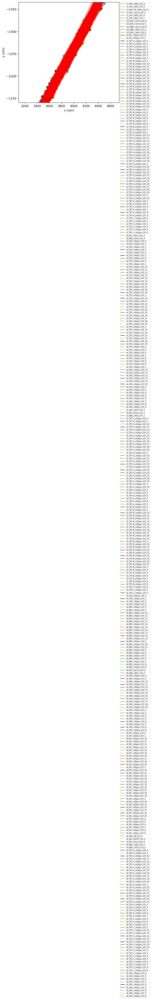

Plotting 2D representation of network cell locations and connections...


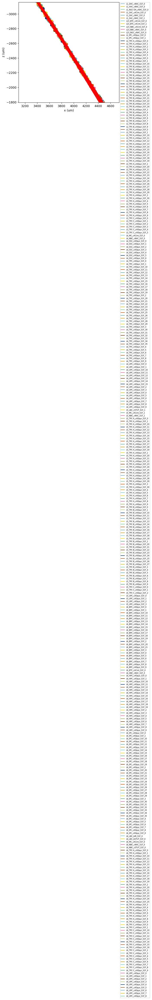

In [33]:
sim.analysis.plot2Dnet(showConns=True, figSize=(6, 6),fontSize=6);
sim.analysis.plot2Dnet(showConns=True, figSize=(6, 6),fontSize=6, view = 'xz');

Plotting 3D cell shape ...


(<Figure size 3600x3600 with 2 Axes>, {})

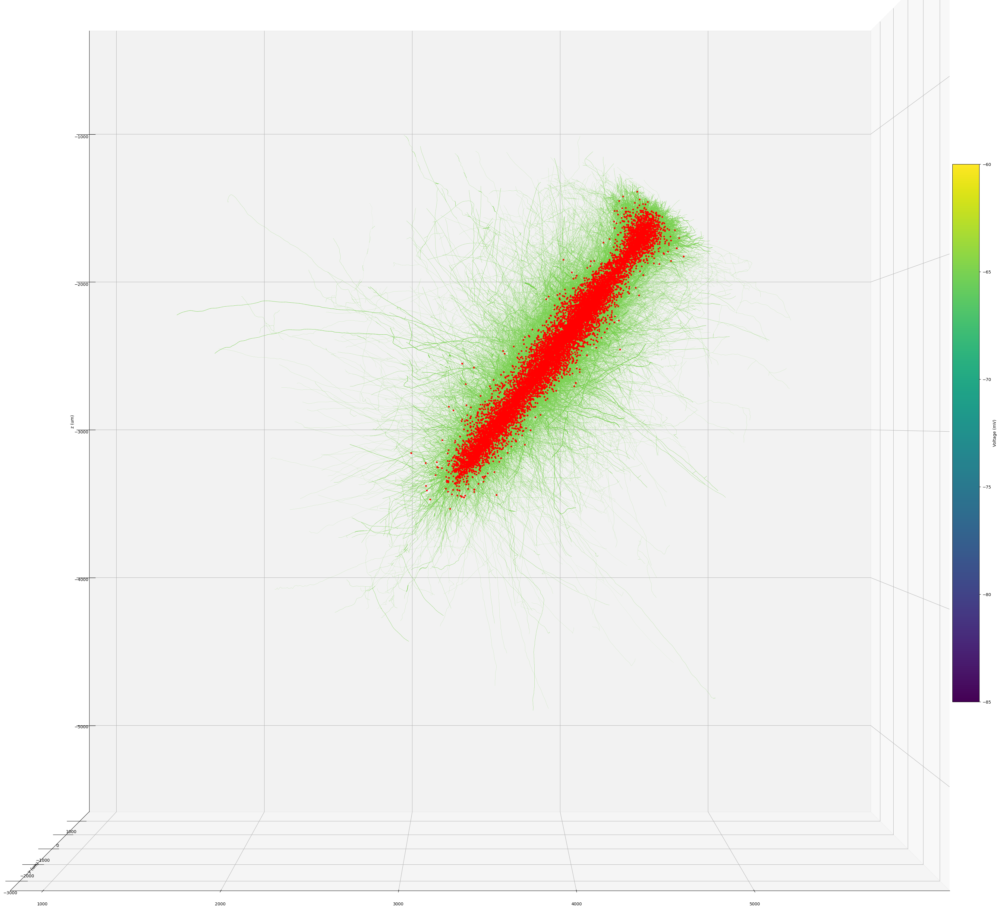

In [34]:
sim.analysis.plotShape(includePre= [ii for ii in range(len(node_gid))], includePost= [ii for ii in range(len(node_gid))], 
                       includeAxon=True, showSyns=True, showElectrodes=False,
    cvar= 'voltage', dist=0.6, elev=0, azim=-90, 
    axisLabels=True, synStyle='o', 
    clim= [-85.0, -60.0], showFig=False, synSize=3, saveFig=False, figSize=(36,36))

Plotting 3D cell shape ...


(<Figure size 3600x3600 with 2 Axes>, {})

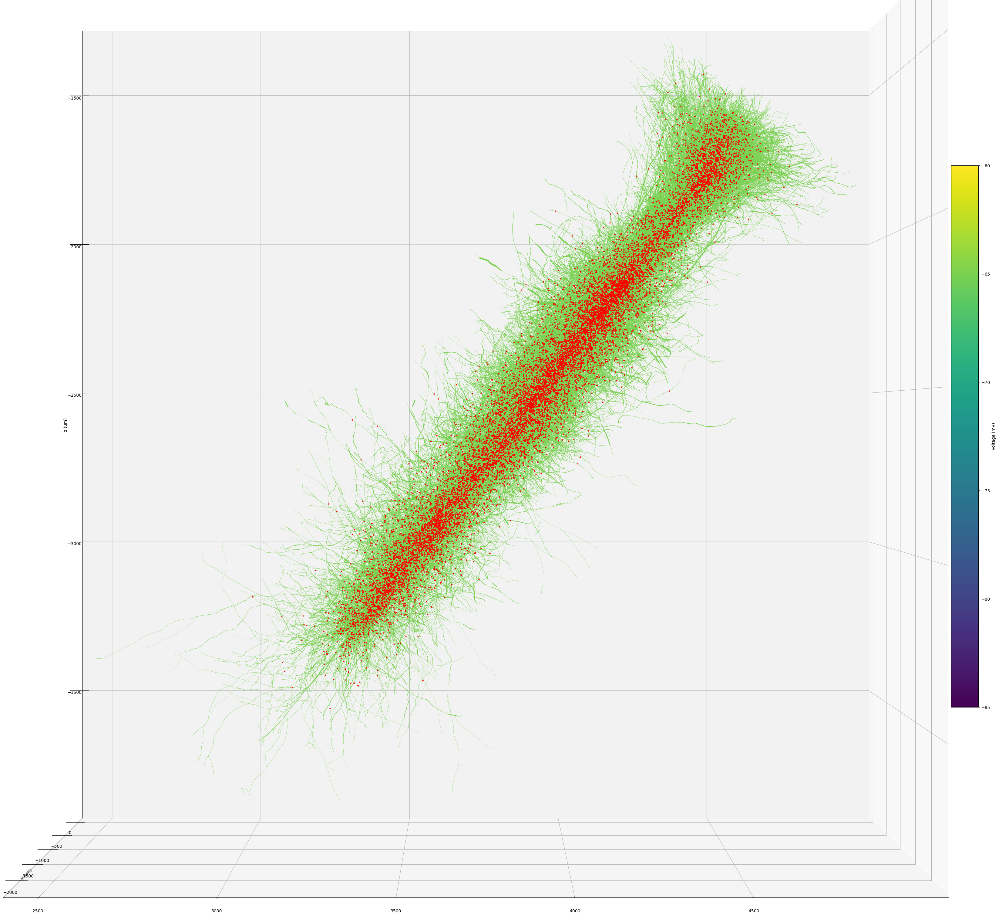

In [35]:
sim.analysis.plotShape(includePre= [ii for ii in range(len(node_gid))], includePost= [ii for ii in range(len(node_gid))], 
                       includeAxon=False, showSyns=True, showElectrodes=False,
    cvar= 'voltage', dist=0.6, elev=0, azim=-90, 
    axisLabels=True, synStyle='o', 
    clim= [-85.0, -60.0], showFig=False, synSize=2, saveFig=False, figSize=(36,36))

Plotting 3D cell shape ...


(<Figure size 600x600 with 2 Axes>, {})

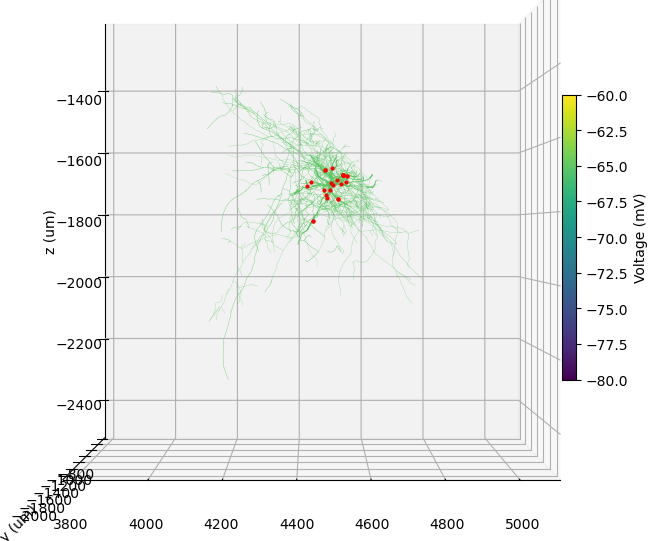

In [37]:
ii = 0
sim.analysis.plotShape(includePre= [ii], includePost= [ii], 
        includeAxon=True, showSyns=True, showElectrodes=False,
        cvar= 'voltage', dist=0.6, elev=0, azim=-90, 
        axisLabels=True, synStyle='o', 
        clim= [-80, -60], showFig=False, synSize=2, saveFig=True, figSize=(6,6))

In [37]:
# for ii in range(len(node_gid)):
#     print(ii)
#     sim.analysis.plotShape(includePre= [ii], includePost= [ii], 
#         includeAxon=True, showSyns=True, showElectrodes=False,
#         cvar= 'voltage', dist=0.6, elev=0, azim=-90, 
#         axisLabels=True, synStyle='o', 
#         clim= [-80, -60], showFig=False, synSize=6, saveFig=True, figSize=(6,6))

In [41]:
def collect_pt3d(self, section):
        """        collect the pt3d info, for each section
        """
        n3dsec = 0
        r3dsec = np.zeros(3)
        for sec in [sec for secName, sec in self.secs.items() if section in secName]:
            sec['hObj'].push()
            n3d = int(neuron.h.n3d())  # get number of n3d points in each section
            # print("get number of n3d points in each section",n3d)
            r3d = np.zeros((3, n3d))  # to hold locations of 3D morphology for the current section
            n3dsec += n3d

            for i in range(n3d):
                r3dsec[0] += neuron.h.x3d(i)
                r3dsec[1] += neuron.h.y3d(i)
                r3dsec[2] += neuron.h.z3d(i)
            
            neuron.h.pop_section()

        r3dsec /= n3dsec
        
        return r3dsec
    
def getSecsPos(self, secList):
        """        Get Secs position
        """
        x3d, y3d, z3d = [], [], []
        
        for secName in secList:
            # print(secName)
            r3dsec = collect_pt3d(self, secName)
            # print(secName, r3dsec)
            
            x3d.append(r3dsec[0])
            y3d.append(r3dsec[1])
            z3d.append(r3dsec[2])
            
        return x3d, y3d, z3d
    
  
secPre = ['axon_32', 'axon_67', 'axon_72', 'axon_76', 'axon_79'] 
secPost = ['apic_47', 'apic_64', 'apic_47', 'apic_86', 'apic_86']

# secPre = ['axon_18', 'axon_32', 'axon_46', 'axon_62', 'axon_70', 'axon_70', 'axon_72'] 
# secPost = ['apic_20', 'apic_16', 'dend_4', 'apic_29', 'apic_30', 'apic_29', 'apic_2']

for ii in range(5):
    for c,metype in enumerate(sim.net.cells):
        if 'presyn' not in metype.tags['pop']:
            # print("\n", metype.tags)
            # secList = [secs for secs in metype.secs.keys() if "pt3d" in metype.secs[secs]['geom']]
            # secList = metype.secLists['all']
            if 'L2_TPC:B_cADpyr_S1F_0' in metype.tags['cellType']:
                secList = secPre[ii:ii+1]
                # print(np.mean(getSecsPos(metype,secList)[0]), np.mean(getSecsPos(metype,secList)[1]), np.mean(getSecsPos(metype,secList)[2]))
                preA = [np.mean(getSecsPos(metype,secList)[0]), np.mean(getSecsPos(metype,secList)[1]), np.mean(getSecsPos(metype,secList)[2])]
            elif 'L5_TPC:B_cADpyr_S1F_1' in metype.tags['cellType']:
                secList = secPost[ii:ii+1]
                # print(np.mean(getSecsPos(metype,secList)[0]), np.mean(getSecsPos(metype,secList)[1]), np.mean(getSecsPos(metype,secList)[2]))
                postA = [np.mean(getSecsPos(metype,secList)[0]), np.mean(getSecsPos(metype,secList)[1]), np.mean(getSecsPos(metype,secList)[2])]
                postPosition = [np.mean(getSecsPos(metype,metype.secLists['all'][0:1])[0]), np.mean(getSecsPos(metype,metype.secLists['all'][0:1])[1]), np.mean(getSecsPos(metype,metype.secLists['all'][0:1])[2])]
                
    print('L2_TPC:B_cADpyr_S1F_0 -> L5_TPC:B_cADpyr_S1F_1','\t\tdistance Syn\t\t',secPre[ii],secPost[ii],'\t d_um = ',np.sqrt(sum((np.array(preA) - np.array(postA))**2)))
    # print('distance Soma post',np.sqrt(sum((np.array(postPosition) - np.array(postA))**2)),'\t\tdistance Soma  pre',np.sqrt(sum((np.array(preA) - np.array(postPosition))**2)))
    # print()


L2_TPC:B_cADpyr_S1F_0 -> L5_TPC:B_cADpyr_S1F_1 		distance Syn		 axon_32 apic_47 	 d_um =  114.78702531190855
L2_TPC:B_cADpyr_S1F_0 -> L5_TPC:B_cADpyr_S1F_1 		distance Syn		 axon_67 apic_64 	 d_um =  344.423575377986
L2_TPC:B_cADpyr_S1F_0 -> L5_TPC:B_cADpyr_S1F_1 		distance Syn		 axon_72 apic_47 	 d_um =  128.11842828795486
L2_TPC:B_cADpyr_S1F_0 -> L5_TPC:B_cADpyr_S1F_1 		distance Syn		 axon_76 apic_86 	 d_um =  118.66390404514358
L2_TPC:B_cADpyr_S1F_0 -> L5_TPC:B_cADpyr_S1F_1 		distance Syn		 axon_79 apic_86 	 d_um =  117.387989738322


In [53]:
# netParams.connParams['L2_TPC:B_cADpyr_S1F_0->L5_TPC:B_cADpyr_S1F_1']
cellName_list[gid], cellName_list[gid2]

('L2_TPC:B_cADpyr_S1F_0', 'L5_TPC:C_cADpyr_S1F_0')

In [60]:
for gid in sorted(cellName_list.keys()):
    for gid2 in sorted(cellName_list.keys()):

        var_list_a = ['@source_node', 'afferent_center_x', 'afferent_center_y', 'afferent_center_z', 'afferent_section_id', 'afferent_section_pos', 'afferent_section_type', 'afferent_segment_id', 
                    'afferent_segment_offset', 'afferent_surface_x', 'afferent_surface_y', 'afferent_surface_z', '@target_node', 'efferent_center_x', 'efferent_center_y', 'efferent_center_z', 
                    'efferent_section_id', 'efferent_section_pos', 'efferent_section_type', 'efferent_segment_id', 'efferent_segment_offset', 'efferent_surface_x', 'efferent_surface_y', 
                    'efferent_surface_z', 'spine_length', 'syn_property_rule', 'syn_type_id']
        # afferent edges of node_ids[gid2]
        sampled_edge_ids = conn.afferent_edges(gid2)    
        # var_list_a = sorted(conn.property_names)[0:12]    
        var_list_a =  ['@source_node', 'afferent_center_x', 'afferent_center_y', 'afferent_center_z', 
                    'afferent_section_pos', 'afferent_section_type', 'afferent_segment_id',
                    'afferent_section_id', 
                    'afferent_segment_offset',
                    # '@target_node', 'efferent_center_x', 'efferent_center_y', 'efferent_center_z', 
                    #   'efferent_section_id',     
                    #   'efferent_segment_offset', 
                    #   'spine_length', 'syn_property_rule', 'syn_type_id'
                    ]
        connsinfo = conn.get(sampled_edge_ids,var_list_a)

        if len(connsinfo.get(connsinfo['@source_node']==gid)) >= 20:
            print(gid,cellName_list[gid], cellName_list[gid2],gid2,len(connsinfo.get(connsinfo['@source_node']==gid)))
            print(netParams.connParams[cellName_list[gid]+'->'+cellName_list[gid2]])

133426 L4_TPC_cADpyr_S1F_3 L5_LBC_cSTUT_S1F_0 173539 20
{'preConds': {'pop': 'L4_TPC_cADpyr_S1F_3'}, 'postConds': {'pop': 'L5_LBC_cSTUT_S1F_0'}, 'connList': [[0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0], [0, 0]], 'sec': ['soma_0', 'soma_0', 'soma_0', 'soma_0', 'dend_14', 'dend_17', 'dend_2', 'dend_2', 'dend_58', 'dend_60', 'soma_0', 'soma_0', 'soma_0', 'soma_0', 'dend_29', 'dend_29', 'dend_14', 'dend_6', 'dend_46', 'dend_76'], 'synMech': 'L4_TPC_cADpyr_S1F_3->L5_LBC_cSTUT_S1F_0', 'weight': [0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391, 0.8454380035400391

In [61]:
gid = 133426
gid2 = 173539

var_list_a = ['@source_node', 'afferent_center_x', 'afferent_center_y', 'afferent_center_z', 'afferent_section_id', 'afferent_section_pos', 'afferent_section_type', 'afferent_segment_id', 
              'afferent_segment_offset', 'afferent_surface_x', 'afferent_surface_y', 'afferent_surface_z', '@target_node', 'efferent_center_x', 'efferent_center_y', 'efferent_center_z', 
              'efferent_section_id', 'efferent_section_pos', 'efferent_section_type', 'efferent_segment_id', 'efferent_segment_offset', 'efferent_surface_x', 'efferent_surface_y', 
              'efferent_surface_z', 'spine_length', 'syn_property_rule', 'syn_type_id']
# afferent edges of node_ids[gid2]
sampled_edge_ids = conn.afferent_edges(gid2)    
# var_list_a = sorted(conn.property_names)[0:12]    
var_list_a =  ['@source_node', 'afferent_center_x', 'afferent_center_y', 'afferent_center_z', 
               'afferent_section_pos', 'afferent_section_type', 'afferent_segment_id',
               'afferent_section_id', 
              'afferent_segment_offset',
              # '@target_node', 'efferent_center_x', 'efferent_center_y', 'efferent_center_z', 
            #   'efferent_section_id',     
            #   'efferent_segment_offset', 
            #   'spine_length', 'syn_property_rule', 'syn_type_id'
              ]
connsinfo = conn.get(sampled_edge_ids,var_list_a)
connsinfo.get(connsinfo['@source_node']==gid)

,@source_node,afferent_center_x,afferent_center_y,afferent_center_z,afferent_section_pos,afferent_section_type,afferent_segment_id,afferent_section_id,afferent_segment_offset
263064425,133426,4062.779785,-1271.787598,-2302.896729,0.000000,1,0,0,0.000000
263064426,133426,4062.779785,-1271.787598,-2302.896729,0.000000,1,0,0,0.000000
263064427,133426,4062.779785,-1271.787598,-2302.896729,0.000000,1,0,0,0.000000
263064428,133426,4062.779785,-1271.787598,-2302.896729,0.000000,1,0,0,0.000000
263064429,133426,4071.660889,-1257.241211,-2296.092529,0.025781,3,1,568,3.196558
263064430,133426,4074.372314,-1261.409424,-2287.995605,0.118295,3,2,571,0.712395
263064431,133426,4037.545654,-1267.621704,-2374.852051,0.975359,3,13,556,1.965854
263064432,133426,4039.432129,-1268.613892,-2370.221436,0.860188,3,11,556,2.889856
263064433,133426,4048.866211,-1249.099121,-2368.468018,0.175776,3,11,612,0.661954
263064434,133426,4076.100830,-1248.420410,-2318.894775,0.123909,3,7,614,3.008288


In [62]:
# print(np.array(preA) + np.array([3000.0, -2000.0, -3500.0]), np.array(postA) + np.array([3000.0, -2000.0, -3500.0]))
# cellName_list, netParams.cellParams['L2_TPC:B_cADpyr_S1F_0']['secs']['apic_20']['geom']
# cellName_list